In [1]:
# add src3 to sys.path for imports
import sys
from pathlib import Path
sys.path.append(str(Path().resolve().parent / "src3"))

In [2]:
import numpy as np
from pathlib import Path
from PIL import Image

from utils import save, load, append, symlink
from process_outputs import app, crop, segment, downsample, center_of_mass, make_overhead, process_outputs

In [3]:
# Run once after kernel restart — keeps Modal app alive for the whole session.
# Must use async with app.run.aio() in Jupyter; the sync app.run() fights Jupyter's event loop.
# _app_ctx holds the context manager so it isn't garbage collected (which would stop the app).
_app_ctx = app.run.aio()
await _app_ctx.__aenter__()

In [4]:
BASE_DIR = Path("/home/ethantu/workspace/good-vibrations/data")
sample_id, output_id = '000005', '000000'

output_dir = BASE_DIR / f'outputs/{output_id}'
sample_dir = BASE_DIR / f'samples/{sample_id}'
raw_overhead_path = output_dir / '00_raw_overhead.png'

speaker = '0001'

# Run process_outputs (everything all at once)

[000005] Process Output 000000
[000005] Box is not empty
[000005] overwriting previous run
[000005] crop: 272.94 ms
[000005] segment: 5616.17 ms
[000005] downsample:   1.69 ms
[000005] center of mass:   1.71 ms
[000005] make overhead: 215.43 ms


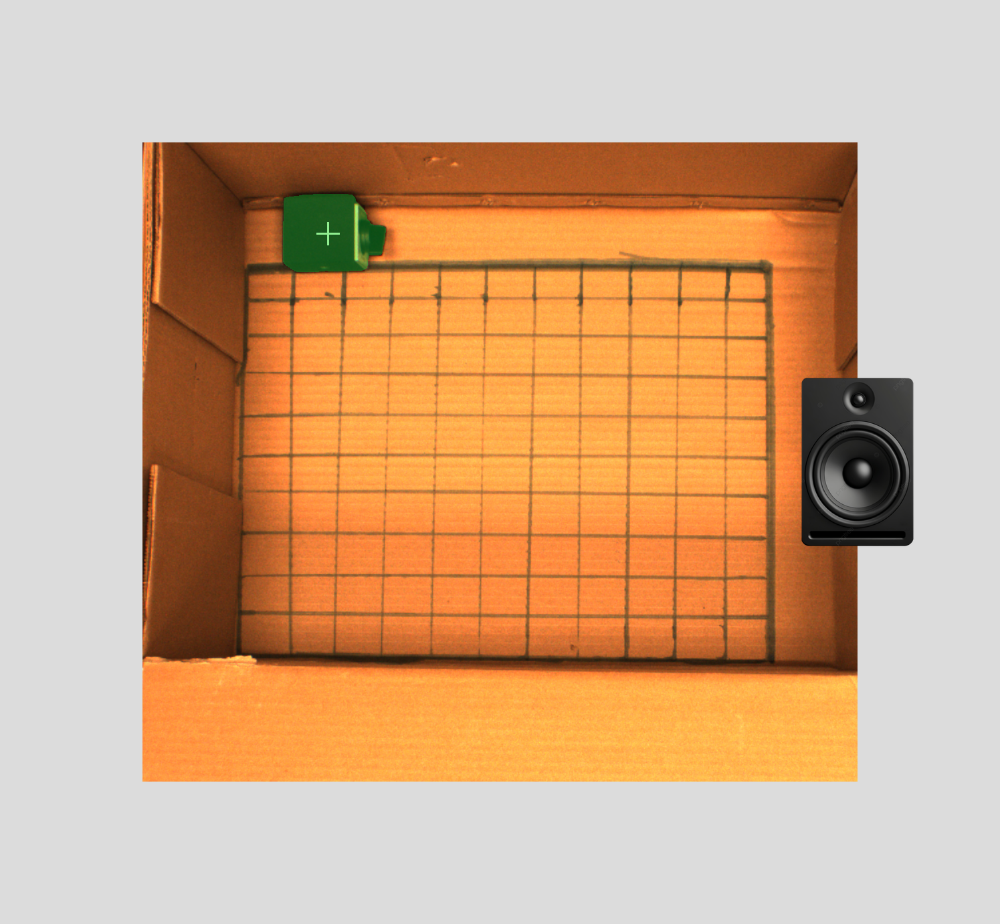

In [15]:
overhead = await process_outputs('0001', raw_overhead_path, output_dir, sample_dir)  # 3-4 secs with model already loaded, 1 min otherwise
overhead

# Run Code step by step

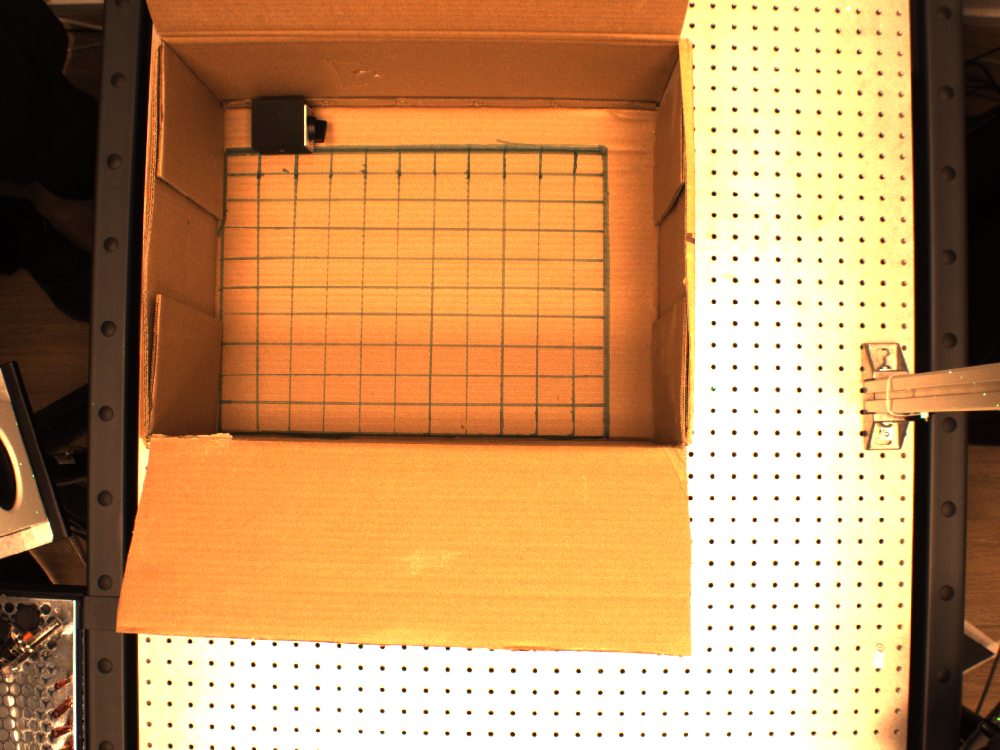

In [5]:
raw_overhead = load(raw_overhead_path)
raw_overhead

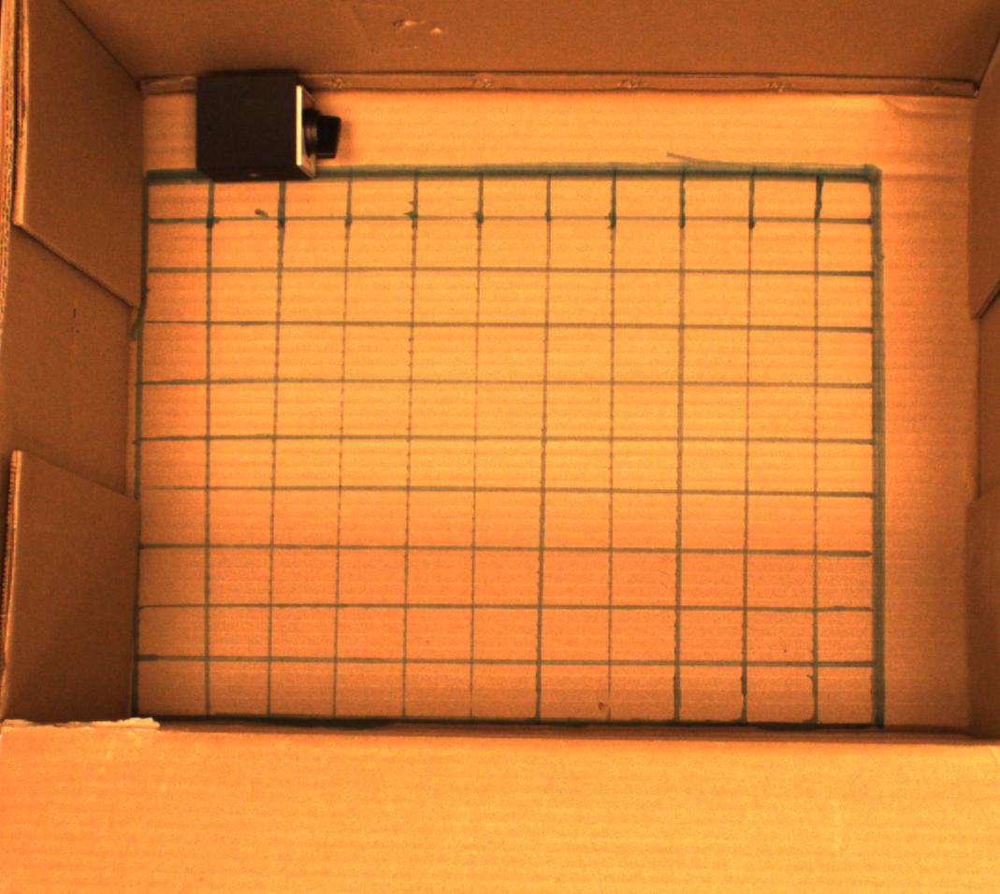

In [6]:
cropped_overhead = crop(raw_overhead, left, right, up, down)
save(cropped_overhead, output_dir / "01_cropped_overhead.png")
cropped_overhead

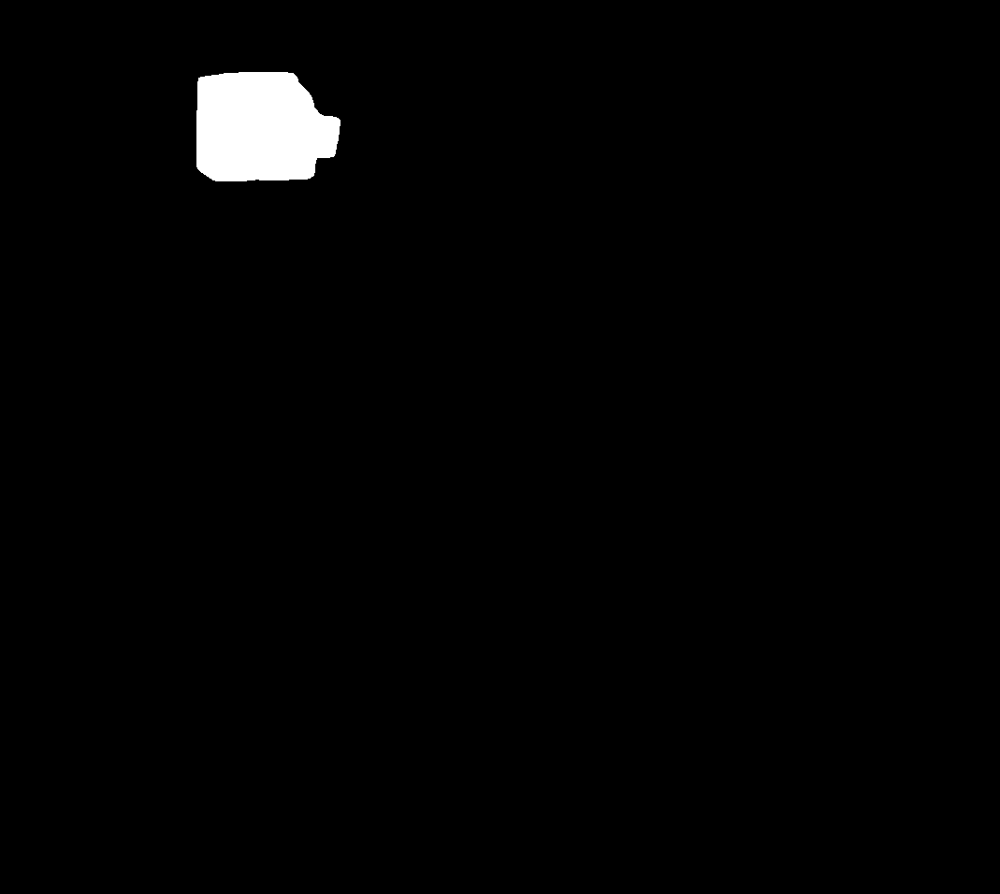

In [7]:
segment_mask = await segment(cropped_overhead, prompt)
save(segment_mask, output_dir / "02_segment_mask.png")
segment_mask

In [8]:
downsampled_segment_mask = downsample(segment_mask, out_h, out_w)
save(downsampled_segment_mask, output_dir / "03_downsampled_segment_mask.png")
downsampled_segment_mask

In [9]:
com = center_of_mass(segment_mask)
downsampled_com = center_of_mass(downsampled_segment_mask)
save({"com": com, "downsampled_com": downsampled_com}, output_dir / "04_com.jsonl")
com, downsampled_com

((136.5919013387852, 277.9092527863879),
 (5.197646952050858, 4.671260415965674))

In [10]:
output_artifacts = ["00_raw_overhead.png", "01_cropped_overhead.png", "02_segment_mask.png", "03_downsampled_segment_mask.png", "04_com.jsonl"]
for output_artifact in output_artifacts: symlink(output_dir / output_artifact, sample_dir / f"outputs/{output_artifact}")

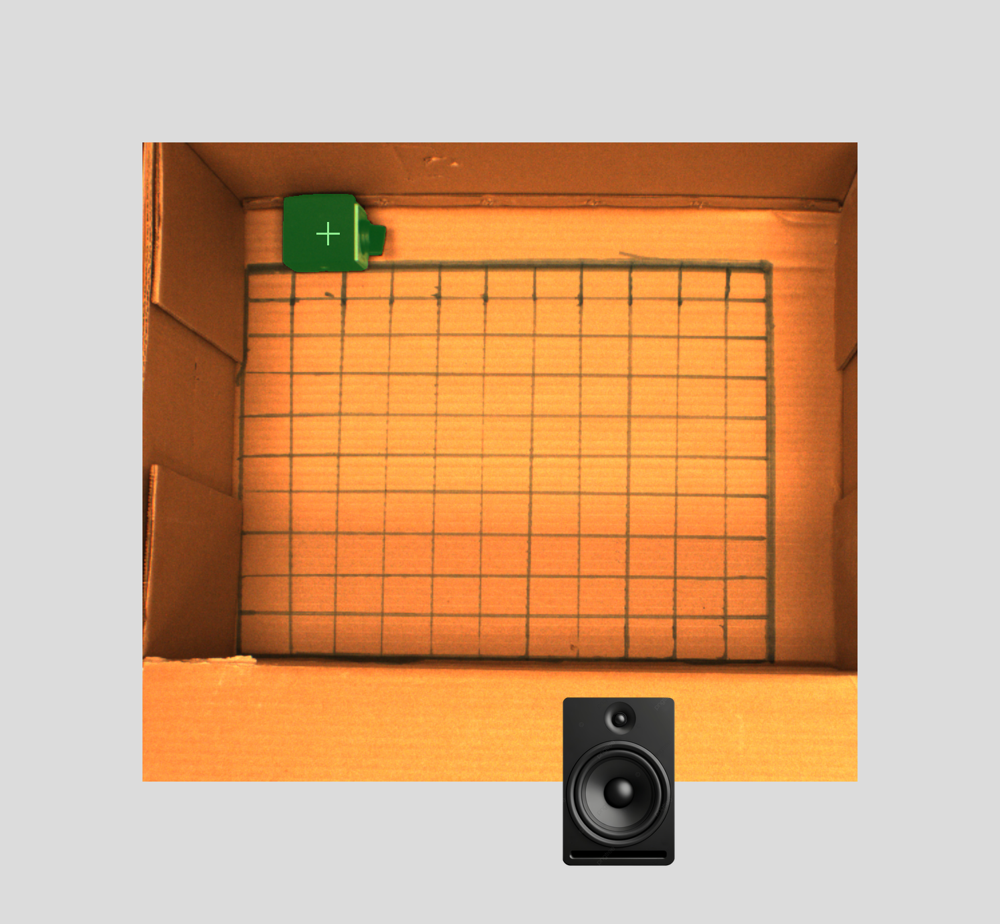

In [11]:
# get overhead image
overhead = make_overhead(cropped_overhead, segment_mask, com, '0010')
save(overhead, sample_dir / "outputs/05_overhead.png")
symlink(sample_dir / "outputs/05_overhead.png", sample_dir / "overhead.png")

overhead

In [ ]:
save(np.array(downsampled_segment_mask, dtype=np.float32) / 255.0, sample_dir / "X.npy")